In [1]:
import scanpy
import matplotlib
from matplotlib import pyplot
import hdf5plugin
import numpy
import scvelo
import seaborn
import warnings

In [51]:
# Scanpy plotting setup

figure_size = (5, 5)
fontsize = 14
scanpy.set_figure_params(figsize=figure_size, dpi=100, color_map="plasma", frameon=True, fontsize=fontsize)
pyplot.rcParams.update({"axes.grid": False})
pyplot.rcParams["text.usetex"] = True
latex_preamble = r"\usepackage{DejaVuSans} \renewcommand{\familydefault}{\sfdefault} \usepackage{sansmath} \sansmath"
pyplot.rcParams["text.latex.preamble"] = latex_preamble

# Suppress warnings
warnings.simplefilter("ignore", category=UserWarning)
warnings.simplefilter("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=matplotlib.MatplotlibDeprecationWarning)

In [3]:
# Read input file
adata = scanpy.read_h5ad("RNA Sequencing Data/splice_counts.h5ad")
print(adata)

AnnData object with n_obs × n_vars = 12791 × 48526
    obs: 'barcode', 'batch', 'sample', 'group', 'day', 'seurat_clusters', 'Sample', 'Group'
    var: 'ensemble_ids', 'gene_symbol'
    uns: 'Group_colors', 'Sample_colors', 'group_colors', 'sample_colors'
    obsm: 'X_FDL', 'X_umap'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'


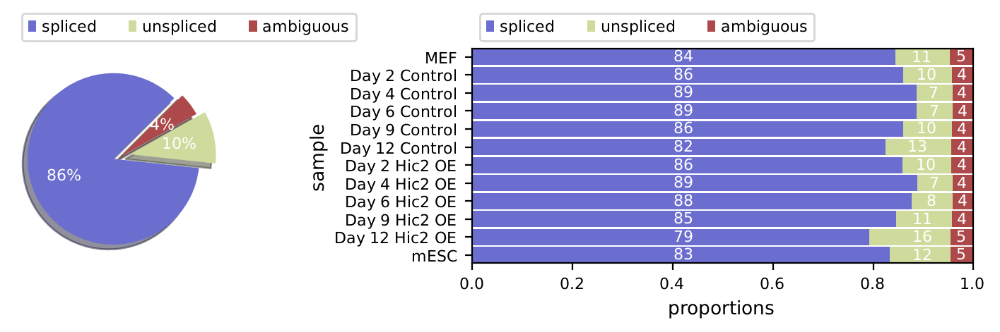

In [4]:
scvelo.pl.proportions(adata, groupby="sample")

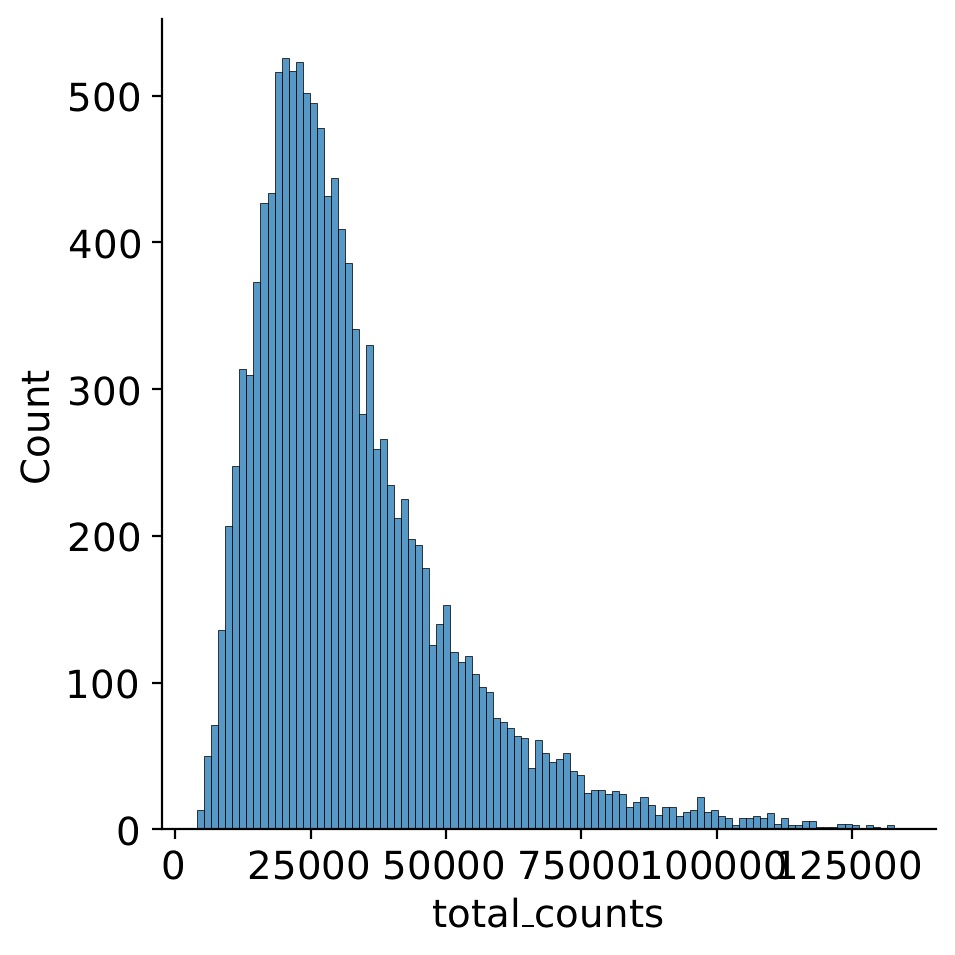

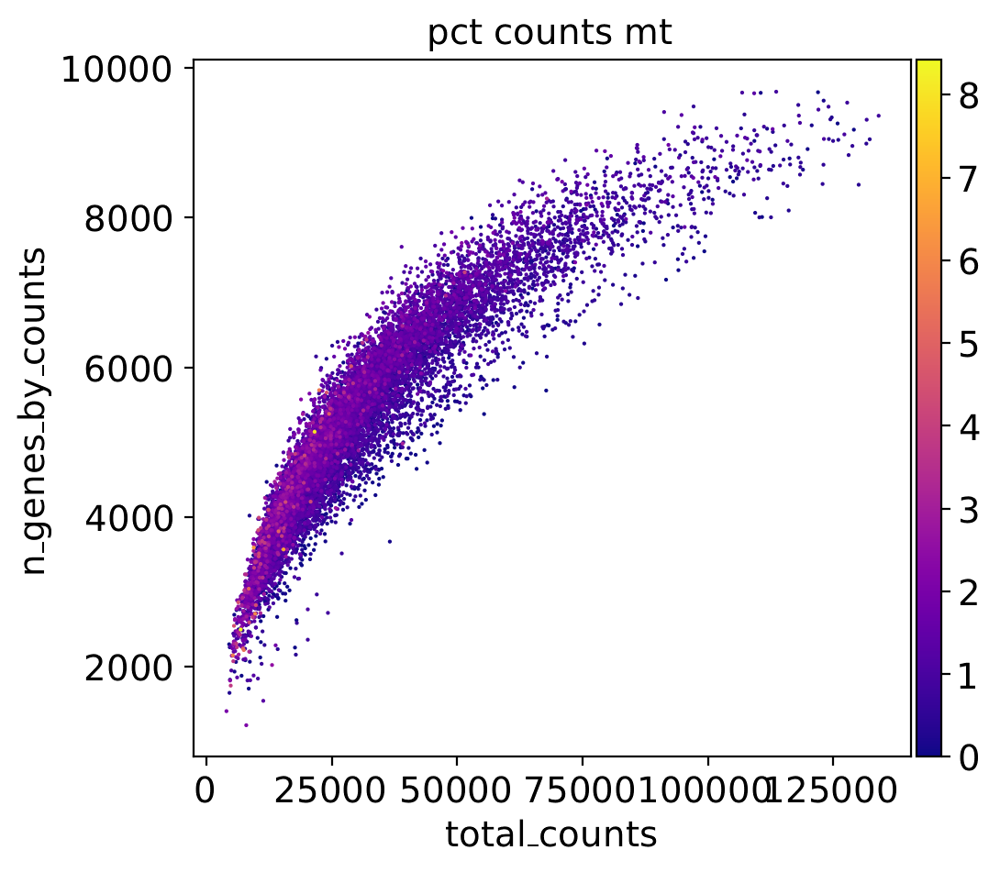

In [5]:
# Quality control

adata.var["mt"] = adata.var_names.str.startswith("mt-")
scanpy.pp.calculate_qc_metrics(
    adata, qc_vars=["mt"], inplace=True, percent_top=[], log1p=False
)

scanpy.pp.calculate_qc_metrics(
    adata, inplace=True, percent_top=[], log1p=False
)
histogram = seaborn.displot(adata.obs["total_counts"], bins=100, kde=False)
scatter = scanpy.pl.scatter(adata, "total_counts", "n_genes_by_counts", color="pct_counts_mt")

View of AnnData object with n_obs × n_vars = 12791 × 48526
    obs: 'barcode', 'batch', 'sample', 'group', 'day', 'seurat_clusters', 'Sample', 'Group', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'ensemble_ids', 'gene_symbol', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'Group_colors', 'Sample_colors', 'group_colors', 'sample_colors'
    obsm: 'X_FDL', 'X_umap'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'


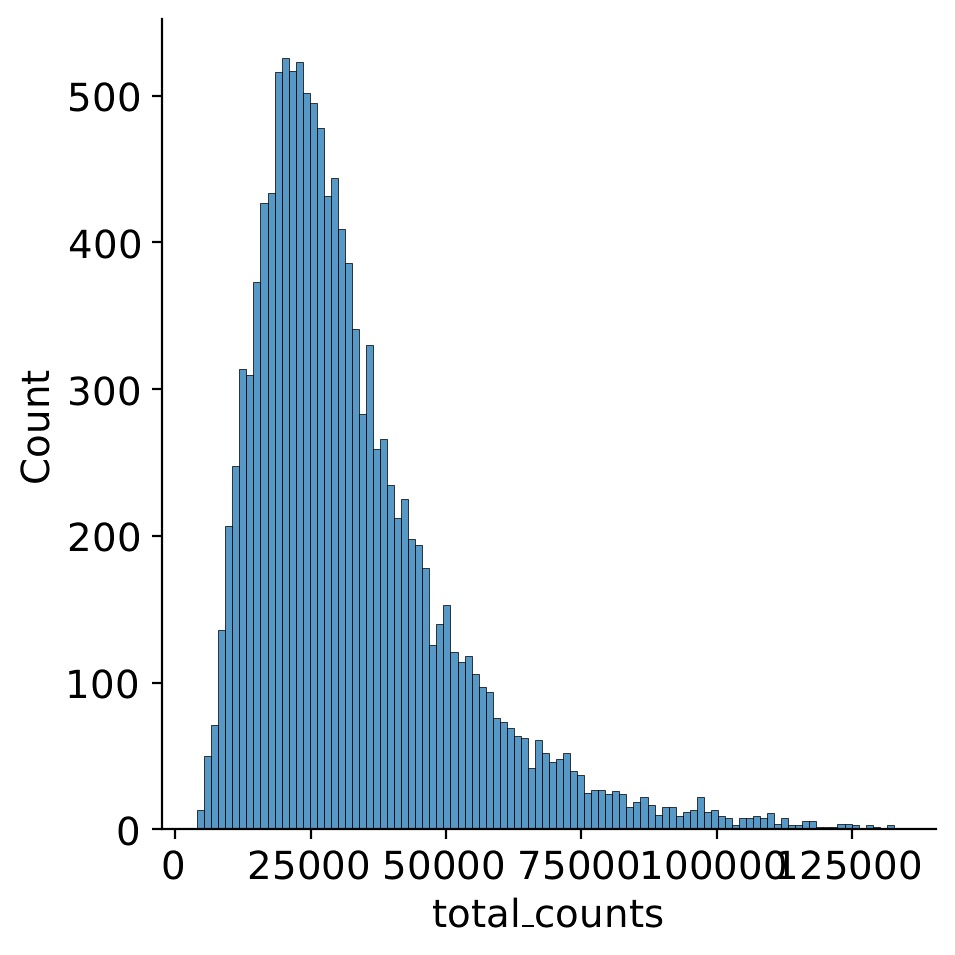

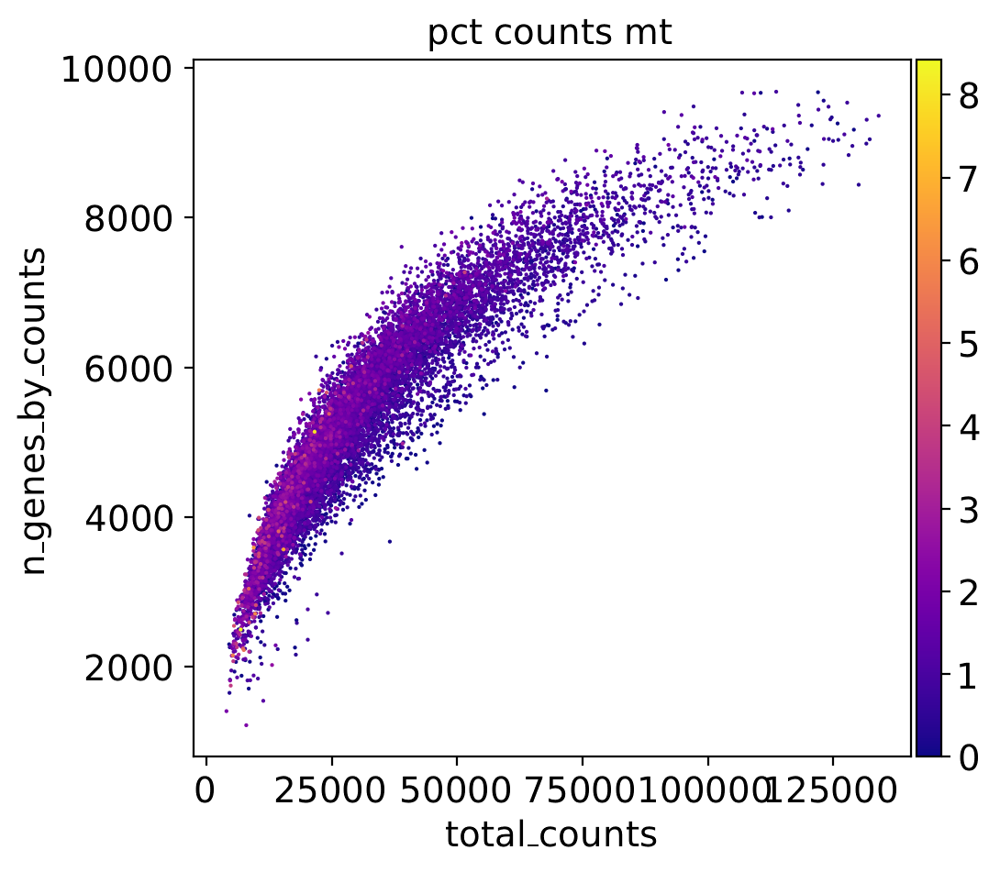

In [6]:
# Filter cells by counts per cell, total counts and percent mitochondrial
included_cells = (adata.obs["n_genes_by_counts"] >= 200)*(adata.obs['total_counts'] <= 150000)*(adata.obs['pct_counts_mt'] < 10)
adata = adata[included_cells]
print(adata)
histogram = seaborn.displot(adata.obs["total_counts"], bins=100, kde=False)
scatter = scanpy.pl.scatter(adata, "total_counts", "n_genes_by_counts", color="pct_counts_mt")

In [7]:
# Filter and normalize

adata_velocity = adata.copy()

# Filter genes by spliced and unspliced counts and normalize
scvelo.pp.filter_and_normalize(adata_velocity, min_shared_counts=20, n_top_genes=2000)

print(f"Filtered Anndata object:\n{adata_velocity}")

Filtered out 35658 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 2000 highly variable genes.
Logarithmized X.
Filtered Anndata object:
AnnData object with n_obs × n_vars = 12791 × 2000
    obs: 'barcode', 'batch', 'sample', 'group', 'day', 'seurat_clusters', 'Sample', 'Group', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts'
    var: 'ensemble_ids', 'gene_symbol', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable'
    uns: 'Group_colors', 'Sample_colors', 'group_colors', 'sample_colors', 'log1p'
    obsm: 'X_FDL', 'X_umap'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'


/home/avesta/m26_losu/miniconda3/envs/velocity/lib/python3.12/site-packages/scvelo/preprocessing/utils.py:705: DeprecationWarning: `log1p` is deprecated since scVelo v0.3.0 and will be removed in a future version. Please use `log1p` from `scanpy.pp` instead.
  log1p(adata)


In [8]:
# Find neighbors

scanpy.pp.neighbors(adata_velocity, n_neighbors=30, n_pcs=30) # Uses PCA of X, can be adapted to use UMAP or FDL

In [9]:
# Compute first and second moments

scvelo.pp.moments(adata_velocity, n_pcs=None, n_neighbors=None)

computing moments based on connectivities
    finished (0:00:02) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [16]:
# Calculate EM velocities

scvelo.tl.recover_dynamics(adata_velocity, n_jobs=32)

recovering dynamics (using 32/64 cores)


  0%|          | 0/1452 [00:00<?, ?gene/s]

/home/avesta/m26_losu/miniconda3/envs/velocity/lib/python3.12/multiprocessing/popen_fork.py:66: DeprecationWarning: This process (pid=2227734) is multi-threaded, use of fork() may lead to deadlocks in the child.
  self.pid = os.fork()


    finished (0:04:23) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)


In [18]:
# Visualize EM velocities

scvelo.tl.velocity(adata_velocity, mode='dynamical')
scvelo.tl.velocity_graph(adata_velocity, n_jobs=32)

computing velocities
    finished (0:00:09) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 32/64 cores)


  0%|          | 0/12791 [00:00<?, ?cells/s]

/home/avesta/m26_losu/miniconda3/envs/velocity/lib/python3.12/multiprocessing/popen_fork.py:66: DeprecationWarning: This process (pid=2227734) is multi-threaded, use of fork() may lead to deadlocks in the child.
  self.pid = os.fork()


    finished (0:00:19) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:01) --> added
    'velocity_FDL', embedded velocity vectors (adata.obsm)


/home/avesta/m26_losu/miniconda3/envs/velocity/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/avesta/m26_losu/miniconda3/envs/velocity/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/avesta/m26_losu/miniconda3/envs/velocity/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/avesta/m26_losu/

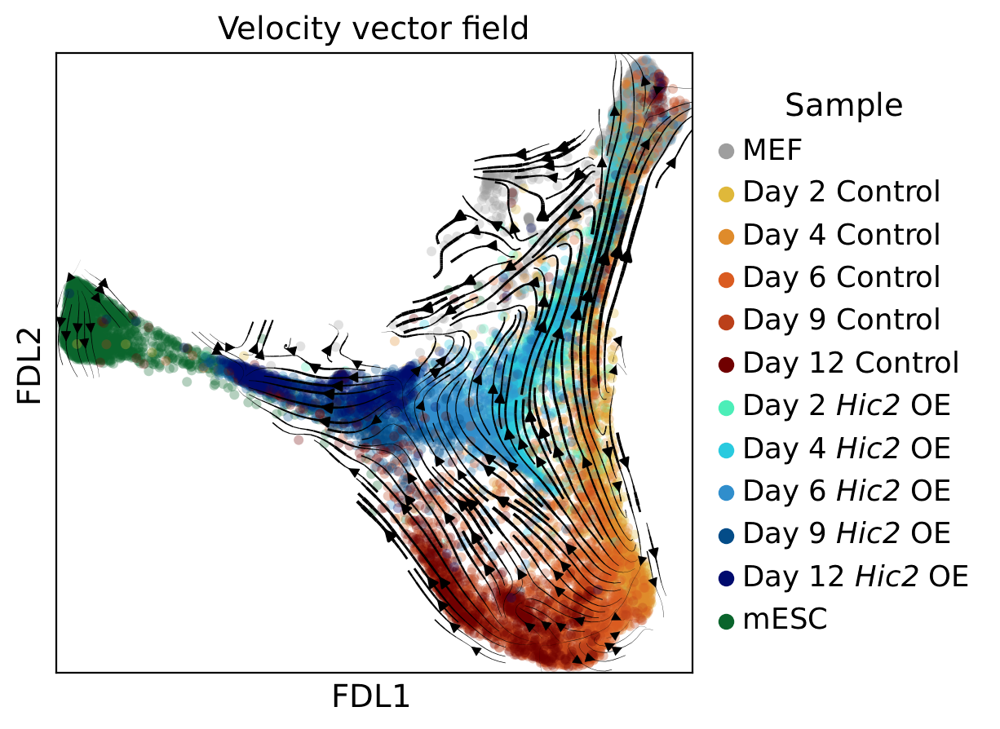

In [19]:
axis = scvelo.pl.velocity_embedding_stream(adata_velocity, vkey="velocity", basis="FDL", color="Sample", legend_loc="right", dpi=100,
                                           title="Velocity vector field", density=3, frameon=True, show=False,
                                           arrow_size=1)
axis.grid(False)
legend = axis.get_legend()
legend.set_title("Sample")
figure = pyplot.gcf()
figure.savefig("Graphs/velocity_stream_scvelo.png", bbox_inches="tight", dpi=300)
pyplot.show()

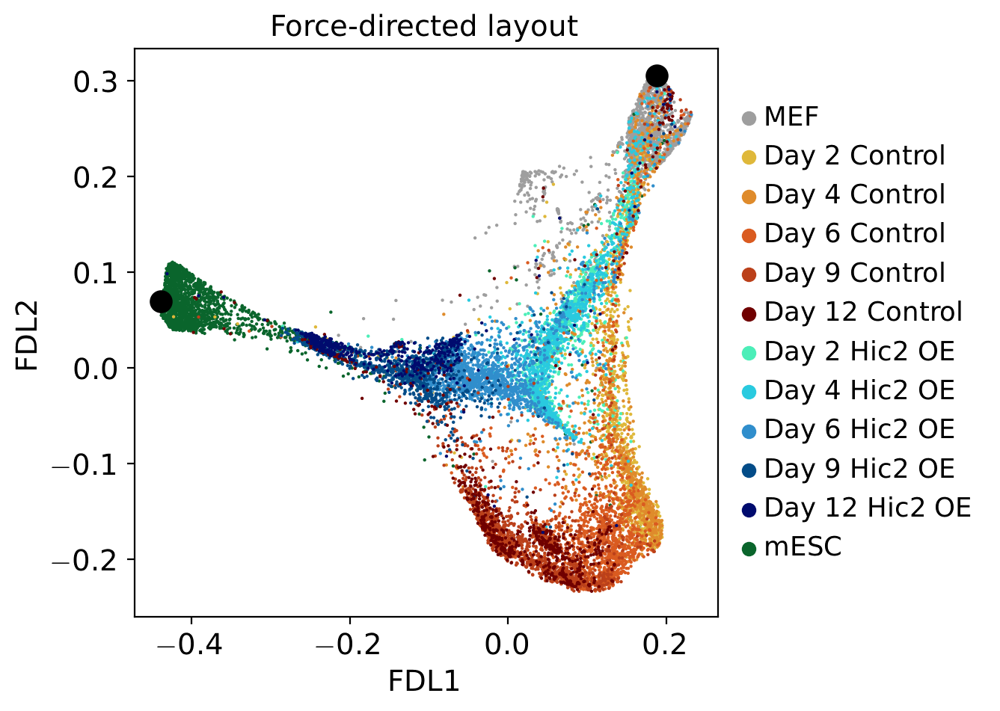

In [20]:
# Find good root and end cells

# Find root
root_filter = (adata_velocity.obs["group"]=="MEF")
# Use MEF cell with largest UMAP2, ignoring outliers with >10
root_index = numpy.argmax(adata_velocity[root_filter].obsm["X_FDL"][:,1])
root_barcode = adata_velocity[root_filter].obs.index[root_index]
adata_velocity.obs["manual_root"] = False
adata_velocity.obs["manual_root"].loc[root_barcode] = True

# Find end
end_filter = adata_velocity.obs["group"]=="mESC"
# Use mESC cell with smallest UMAP1
end_index = numpy.argmin(adata_velocity[end_filter].obsm["X_FDL"][:,0])
end_barcode = adata_velocity[end_filter].obs.index[end_index]
adata_velocity.obs["manual_end"] = False
adata_velocity.obs["manual_end"].loc[end_barcode] = True

ax = scanpy.pl.embedding(basis="FDL", adata=adata_velocity, color="sample", size=10, title="Force-directed layout", show=False)

# Plot UMAP
ax.scatter(*adata_velocity[adata_velocity.obs["manual_end"]].obsm["X_FDL"][0], marker="o", s=100, color="black")
ax.scatter(*adata_velocity[adata_velocity.obs["manual_root"]].obsm["X_FDL"][0], marker="o", s=100, color="black")
ax.yaxis.set_major_locator(matplotlib.ticker.AutoLocator())
ax.xaxis.set_major_locator(matplotlib.ticker.AutoLocator())

pyplot.show()

computing latent time using manual_root, manual_end as prior
    finished (0:00:01) --> added 
    'latent_time', shared time (adata.obs)


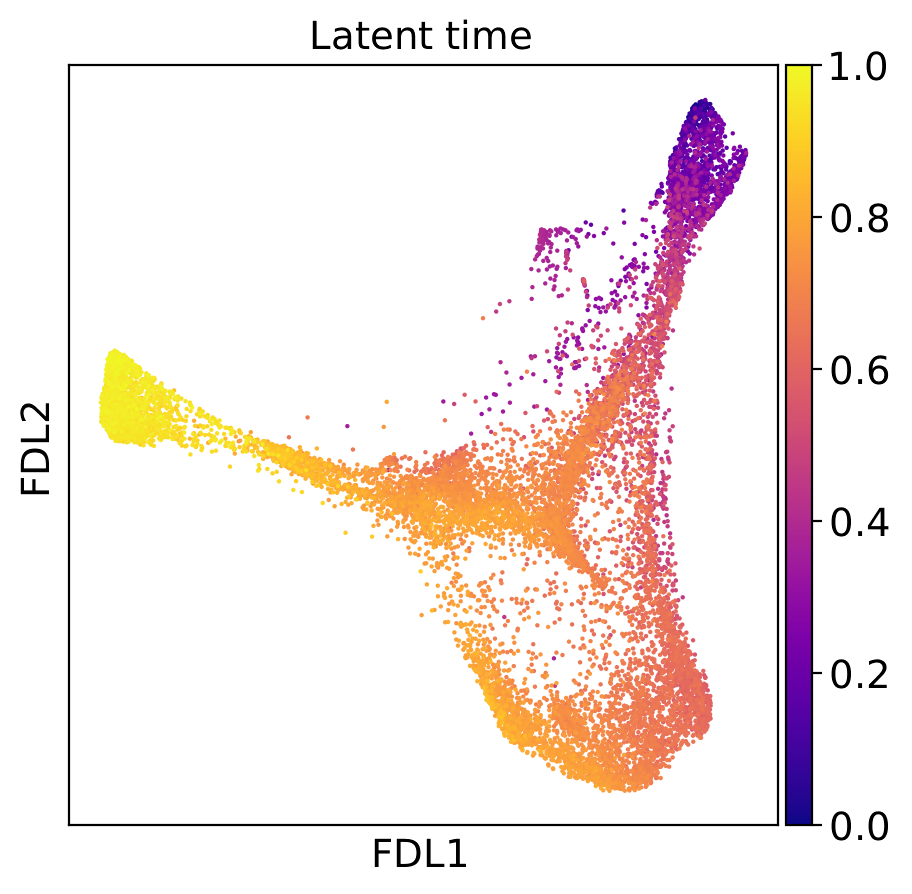

In [21]:
# Latent time

# Calculate latent time
scvelo.tl.recover_latent_time(adata_velocity, root_key="manual_root", end_key="manual_end")

# Plot velocities colored by latent time
axis = scanpy.pl.embedding(basis='FDL', adata=adata_velocity, color=["latent_time"], size=10, title=["Latent time"], show=False)
axis.set_xlabel("FDL1")
axis.set_ylabel("FDL2")
figure = pyplot.gcf()
pyplot.show()
figure.savefig("Graphs/latent_time_scvelo.png", bbox_inches="tight", dpi=300)


/home/avesta/m26_losu/miniconda3/envs/velocity/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/avesta/m26_losu/miniconda3/envs/velocity/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/avesta/m26_losu/miniconda3/envs/velocity/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/avesta/m26_losu/

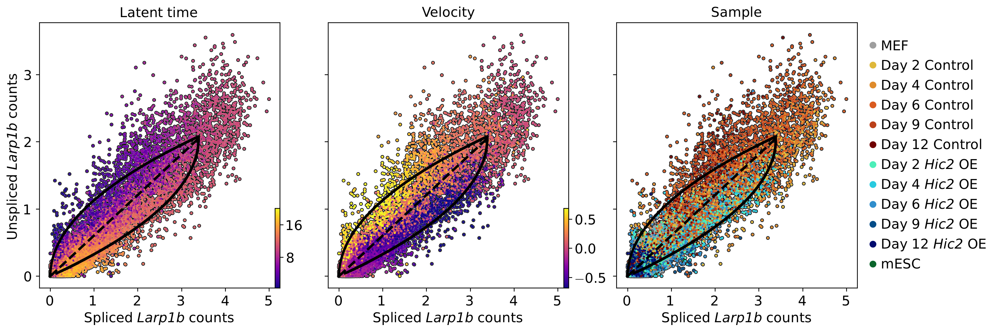

In [22]:
gene = "Larp1b"
axes = scvelo.pl.scatter(adata_velocity, basis=[gene], color=["fit_t", "velocity", "Sample"], frameon=True, color_map="plasma", linecolor="black", show=False,
                         title=["Latent time", "Velocity", "Sample"], sort_order=False, wspace=0.20, size=20, add_outline=True, linewidth=2.5)
y_ticks = range(0, 4)
x_ticks = range(0, 6)
for axis_index, axis in enumerate(axes):
    axis.set_xlabel(r"Spliced \textit{"+gene+"} counts")
    axis.get_legend().remove()
    axis.set_xticks(x_ticks)
    if axis_index == 0:
        axis.set_ylabel(r"Unspliced \textit{"+gene+"} counts")
        axis.set_yticks(y_ticks)
    else:
        axis.set_ylabel("")
        axis.set_yticks(y_ticks, labels=["" for tick in y_ticks])
    if axis_index == 2:
        sample_categories = adata_velocity.obs["Sample"].cat.categories
        sample_colors = adata_velocity.uns["Sample_colors"]
        
        # generate proxy artists for the legend handles
        legend_handles = []
        for category, color in zip(sample_categories, sample_colors):
            handle = matplotlib.lines.Line2D(
                [0], [0], 
                marker="o", 
                color="w", 
                markerfacecolor=color, 
                markersize=8, 
                label=category
            )
            legend_handles.append(handle)
            
        axis.legend(
            handles=legend_handles,
            loc="center left", 
            bbox_to_anchor=(1, 0.5), 
            frameon=False,
            fontsize=14
        )
figure = axis.figure
pyplot.show()
figure.savefig("Graphs/phase_diagram_scvelo_larp1b.png", bbox_inches="tight", dpi=300)

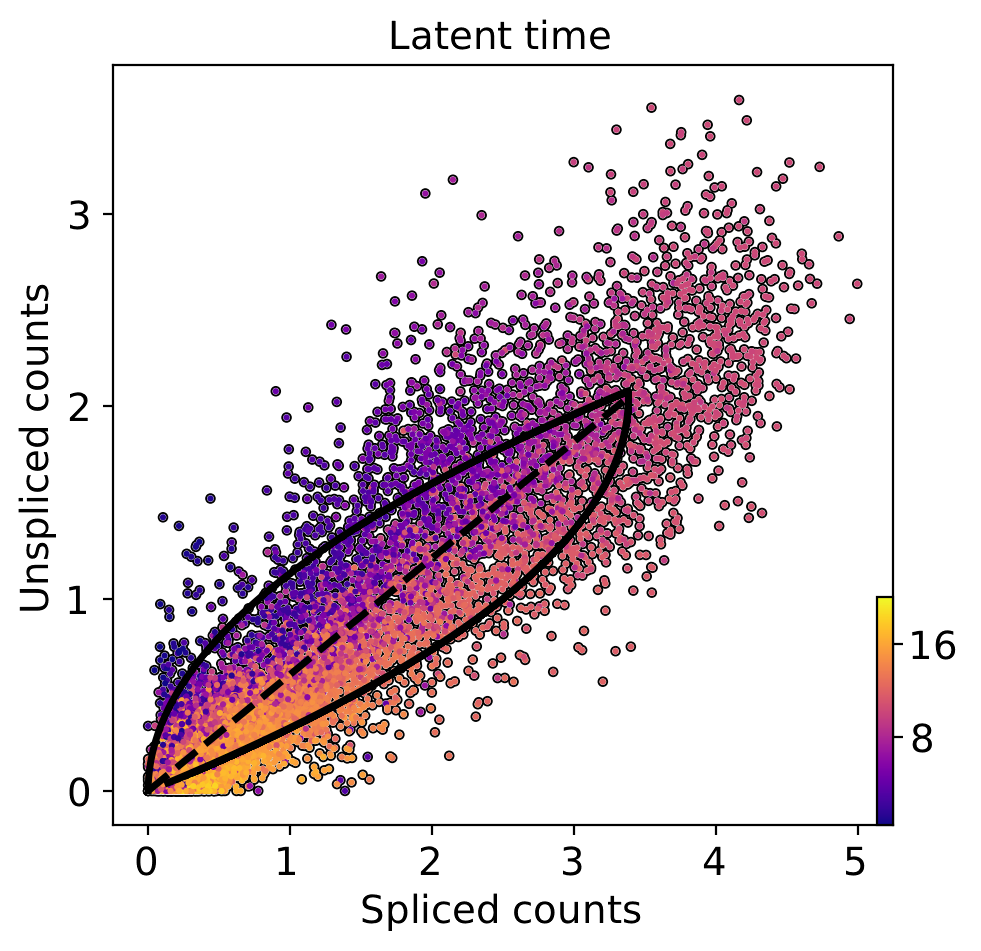

In [108]:
gene = "Larp1b"
axis = scvelo.pl.scatter(adata_velocity, basis=[gene], color=["fit_t"], frameon=True, color_map="plasma", linecolor="black", show=False,
                         title=["Latent time"], sort_order=False, wspace=0.20, size=20, add_outline=True, linewidth=2.5)
y_ticks = range(0, 4)
x_ticks = range(0, 6)
axis.set_xlabel(r"Spliced counts")
axis.get_legend().remove()
axis.set_xticks(x_ticks)
axis.set_ylabel(r"Unspliced counts")
axis.set_yticks(y_ticks)
figure = axis.figure
pyplot.show()
figure.savefig("Graphs/phase_diagram_scvelo_latent_time_larp1b.png", bbox_inches="tight", dpi=300)

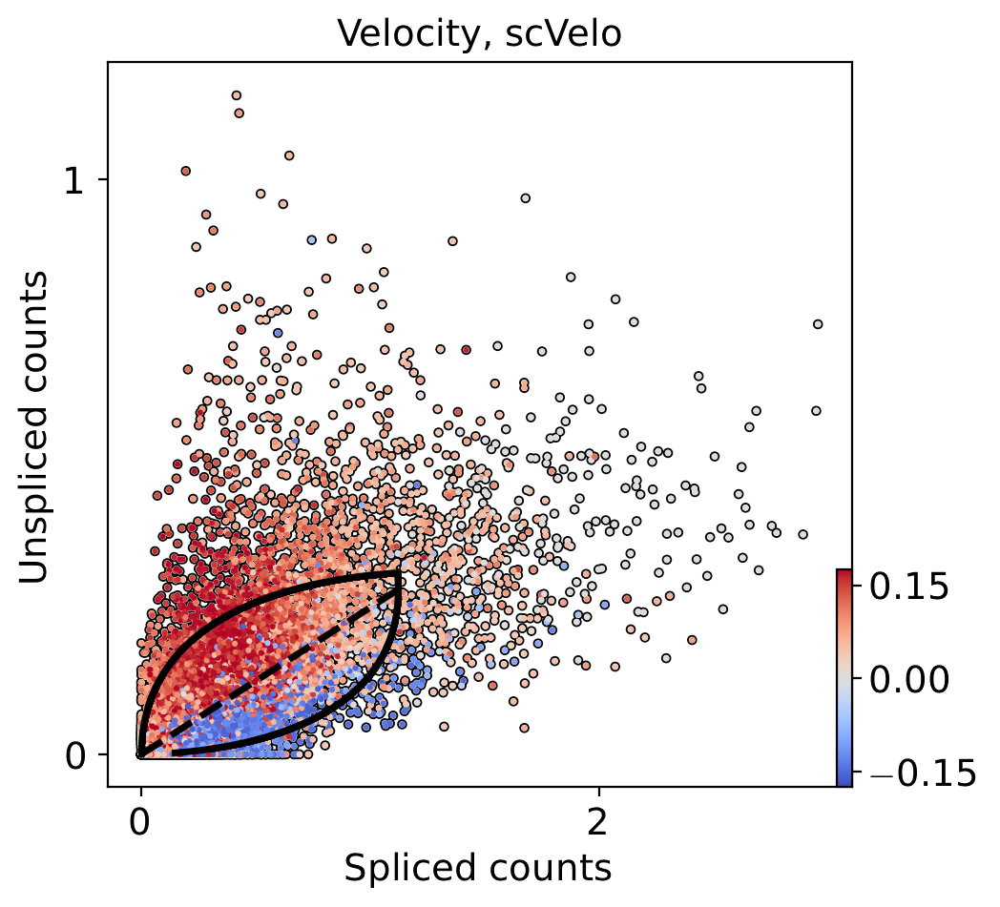

In [81]:
gene = "Atp2b4"
axis = scvelo.pl.scatter(adata_velocity, basis=[gene], color=["velocity"], frameon=True, color_map="coolwarm", linecolor="black", show=False,
                         title=["Velocity, scVelo"], sort_order=False, wspace=0.20, size=20, add_outline=True, linewidth=2.5)
axis.set_xlabel(r"Spliced counts")
axis.get_legend().remove()
axis.set_ylabel(r"Unspliced counts")
figure = axis.figure
pyplot.show()
figure.savefig("Graphs/phase_diagram_scvelo_velocity_atp2b4.png", bbox_inches="tight", dpi=300)

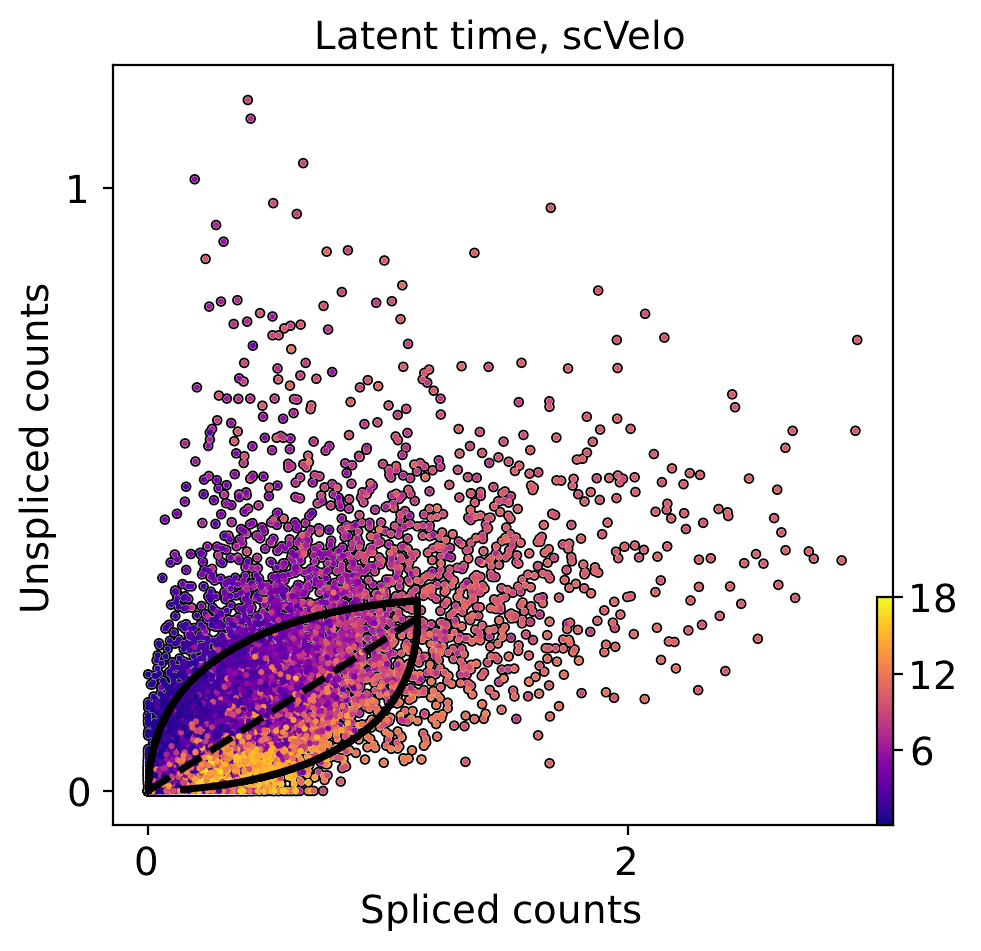

In [101]:
gene = "Atp2b4"
axis = scvelo.pl.scatter(adata_velocity, basis=[gene], color=["fit_t"], frameon=True, color_map="plasma", linecolor="black", show=False,
                         title=["Latent time, scVelo"], sort_order=False, wspace=0.20, size=20, add_outline=True, linewidth=2.5, vmax=18)
axis.set_xlabel(r"Spliced counts")
axis.get_legend().remove()
axis.set_ylabel(r"Unspliced counts")
figure = axis.figure
pyplot.show()
figure.savefig("Graphs/phase_diagram_scvelo_latent_time_apt2b4.png", bbox_inches="tight", dpi=300)

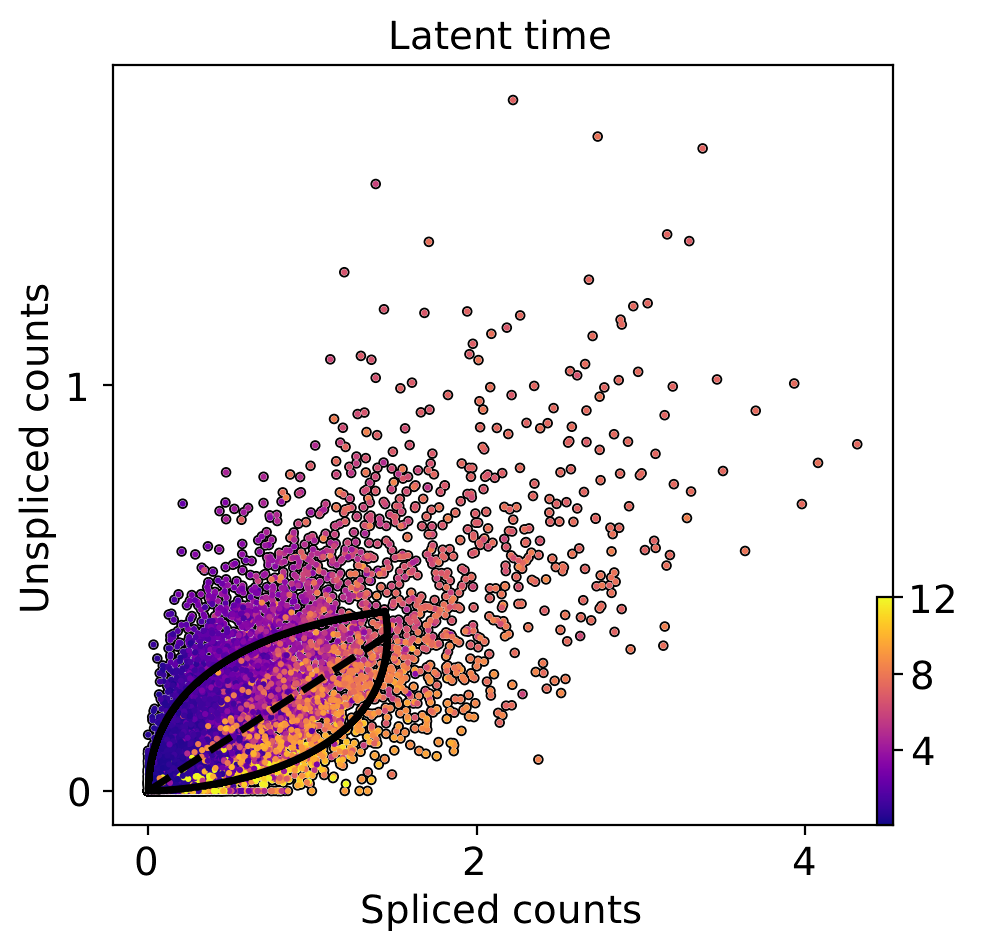

In [98]:
gene = "Cd55"
axis = scvelo.pl.scatter(adata_velocity, basis=[gene], color=["fit_t"], frameon=True, color_map="plasma", linecolor="black", show=False,
                         title=["Latent time"], sort_order=False, wspace=0.20, size=20, add_outline=True, linewidth=2.5, vmax=12)
axis.set_xlabel(r"Spliced counts")
axis.get_legend().remove()
axis.set_ylabel(r"Unspliced counts")
figure = axis.figure
pyplot.show()
figure.savefig("Graphs/phase_diagram_scvelo_latent_time_cd55.png", bbox_inches="tight", dpi=300)

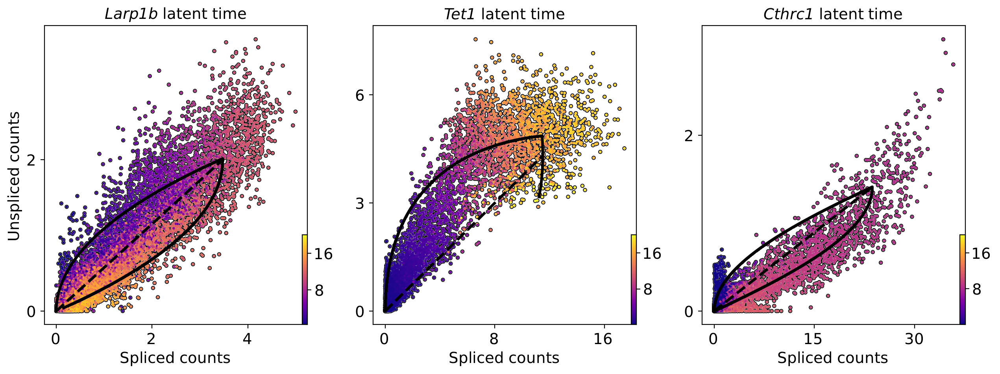

In [284]:
gene_list = ["Larp1b", "Tet1", "Cthrc1"]
titles = [r"\textit{"+gene+"} latent time" for gene in gene_list]
axes = scvelo.pl.scatter(adata_velocity, basis=gene_list, color="fit_t", frameon=True, color_map="plasma", linecolor="black", show=False,
                         title=titles, sort_order=False, wspace=0.25, size=20, add_outline=True, linewidth=2.5)
y_ticks = range(0, 4)
x_ticks = range(0, 6)
for axis_index, axis in enumerate(axes):
    axis.set_xlabel("Spliced counts")
    axis.get_legend().remove()
    if axis_index == 0:
        axis.set_ylabel("Unspliced counts")
    else:
        axis.set_ylabel("")
figure = axis.figure
pyplot.show()
figure.savefig("Graphs/phase_diagram_scvelo_latent_time.png", bbox_inches="tight", dpi=300)

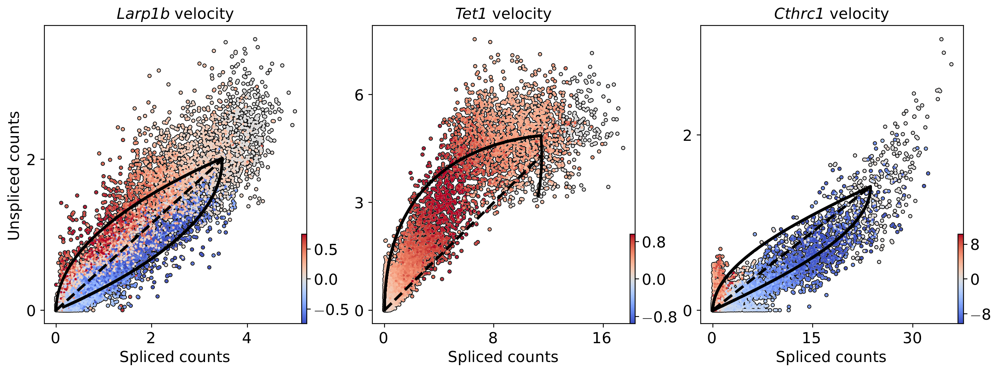

In [287]:
gene_list = ["Larp1b", "Tet1", "Cthrc1"]
titles = [r"\textit{"+gene+"} velocity" for gene in gene_list]
axes = scvelo.pl.scatter(adata_velocity, basis=gene_list, color="velocity", frameon=True, color_map="coolwarm", linecolor="black", show=False,
                         title=titles, sort_order=False, wspace=0.25, size=20, add_outline=True, linewidth=2.5)
y_ticks = range(0, 4)
x_ticks = range(0, 6)
for axis_index, axis in enumerate(axes):
    axis.set_xlabel("Spliced counts")
    axis.get_legend().remove()
    if axis_index == 0:
        axis.set_ylabel("Unspliced counts")
    else:
        axis.set_ylabel("")
figure = axis.figure
pyplot.show()
figure.savefig("Graphs/phase_diagram_scvelo_velocity.png", bbox_inches="tight", dpi=300)

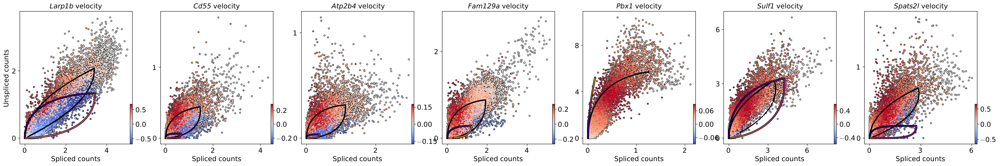

In [ ]:
gene_list = ["Larp1b", "Cd55", "Atp2b4", "Fam129a", "Pbx1", "Sulf1", "Spats2l"]
gene_indices = [adata_velocity.var_names.get_loc(gene) for gene in gene_list]
titles = [r"\textit{"+gene+"} velocity" for gene in gene_list]
axes = scvelo.pl.scatter(adata_velocity, basis=gene_list, color="velocity", frameon=True, color_map="coolwarm", linecolor="black", show=False,
                         title=titles, sort_order=False, wspace=0.25, size=20, add_outline=True, linewidth=2.5)
for axis_index, axis in enumerate(axes):
    gene = gene_list[axis_index]
    gene_index = gene_indices[axis_index]

    alpha = adata_velocity.var.loc[gene, "fit_alpha"]
    beta = adata_velocity.var.loc[gene, "fit_beta"]
    gamma = adata_velocity.var.loc[gene, "fit_gamma"]
    t_switch = adata_velocity.var.loc[gene, "fit_t_"]
    scaling_factor = adata_velocity.var.loc[gene, "fit_scaling"]

    t_max = 20

    # generate a linearly spaced time array for the integration
    time_array = numpy.linspace(0, t_max, 500)

    # define the system of ordinary differential equations for splicing kinetics
    def splicing_kinetics(time, state):
        u, s = state
        # transcription is active before the switch time and inactive after
        current_alpha = alpha if time <= t_switch else 0.0
        du_dt = current_alpha - beta * u
        ds_dt = beta * u - gamma * s
        return [du_dt, ds_dt]

    # solve the system numerically over the time array
    solution = scipy.integrate.solve_ivp(
        fun=splicing_kinetics,
        t_span=(0, t_max),
        y0=[0.0, 0.0],
        t_eval=time_array,
        method="RK45"
    )

    unspliced_trajectory = solution.y[0]
    spliced_trajectory = solution.y[1]

    # plot the background black outline first with a larger linewidth
    axis.plot(
        spliced_trajectory, 
        unspliced_trajectory, 
        color="black", 
        linewidth=4, 
        zorder=1
    )

    # transform 1d coordinate arrays into a set of 2d points
    points = numpy.array([spliced_trajectory, unspliced_trajectory]).T.reshape(-1, 1, 2)

    # link consecutive points together to define the line segments
    segments = numpy.concatenate([points[:-1], points[1:]], axis=1)

    # initialize the line collection with the segments and matching colormap
    line_collection = matplotlib.collections.LineCollection(
        segments, 
        cmap="plasma", 
        linewidth=2,
        zorder=2
    )

    # map the time array to the line collection to determine segment colors
    line_collection.set_array(time_array)

    # render the line collection onto the axis
    axis.add_collection(line_collection)

    axis.set_xlabel("Spliced counts")
    axis.get_legend().remove()
    if axis_index == 0:
        axis.set_ylabel("Unspliced counts")
    else:
        axis.set_ylabel("")
figure = axis.figure
pyplot.show()
# figure.savefig("Graphs/phase_diagram_scvelo_velocity.png", bbox_inches="tight", dpi=300)

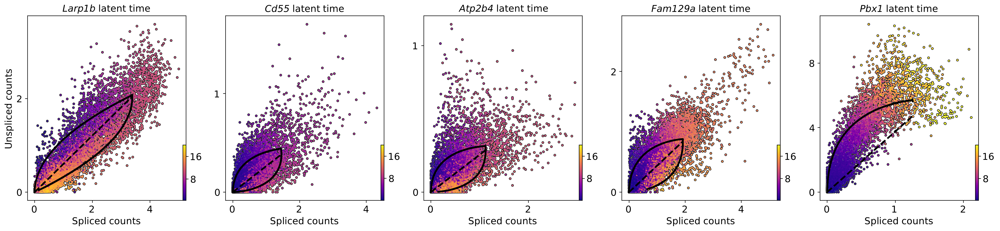

In [102]:
gene_list = ["Larp1b", "Cd55", "Atp2b4", "Fam129a", "Pbx1"]
titles = [r"\textit{"+gene+"} latent time" for gene in gene_list]
axes = scvelo.pl.scatter(adata_velocity, basis=gene_list, color="fit_t", frameon=True, color_map="plasma", linecolor="black", show=False,
                         title=titles, sort_order=False, wspace=0.25, size=20, add_outline=True, linewidth=2.5)
for axis_index, axis in enumerate(axes):
    axis.set_xlabel("Spliced counts")
    axis.get_legend().remove()
    if axis_index == 0:
        axis.set_ylabel("Unspliced counts")
    else:
        axis.set_ylabel("")
figure = axis.figure
pyplot.show()
# figure.savefig("Graphs/phase_diagram_scvelo_velocity.png", bbox_inches="tight", dpi=300)

In [ ]:
# Save adata
adata_velocity.write_h5ad(
    "../RNA Sequencing Data/velocity_scvelo.h5ad",
    compression=hdf5plugin.FILTERS["zstd"]
)